In [ ]:
!git config --global credential.helper store
!pip uninstall transformers -y
!pip install git+https://github.com/huggingface/transformers@v4.49.0-Gemma-3

In [2]:
import base64
import io

import requests
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from PIL import Image, ImageDraw
from huggingface_hub import notebook_login

In [3]:
notebook_login()

In [4]:
def load_model(model_id):
    model = Gemma3ForConditionalGeneration.from_pretrained(
        model_id, device_map="auto"
    ).eval()
    processor = AutoProcessor.from_pretrained(model_id)
    return model, processor


def infer(
    model,
    processor,
    message_txt,
    image_url,
    max_new_tokens=100,
):
    messages = [
        {
            "role": "system",
            "content": [{"type": "text", "text": "You are a helpful assistant."}]
        },
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image_url},
                {"type": "text", "text": message_txt}
            ]
        }
    ]
    inputs = processor.apply_chat_template(
        messages, add_generation_prompt=True, tokenize=True,
        return_dict=True, return_tensors="pt"
    ).to(model.device, dtype=torch.bfloat16)
    input_len = inputs["input_ids"].shape[-1]

    with torch.inference_mode():
        generation = model.generate(**inputs, max_new_tokens=100, do_sample=False)
        generation = generation[0][input_len:]

    decoded = processor.decode(generation, skip_special_tokens=True)
    return decoded


def img2base64(img: Image.Image):
    buffered = io.BytesIO()
    img.save(buffered, format='PNG')
    base64_str = base64.b64encode(buffered.getvalue()).decode('utf-8')
    return base64_str

## 12b

In [5]:
model_id = 'google/gemma-3-12b-it'
model, processor = load_model(model_id)

config.json:   0%|          | 0.00/916 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/109k [00:00<?, ?B/s]

model-00001-of-00005.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00002-of-00005.safetensors:   0%|          | 0.00/4.93G [00:00<?, ?B/s]

model-00003-of-00005.safetensors:   0%|          | 0.00/4.93G [00:00<?, ?B/s]

model-00004-of-00005.safetensors:   0%|          | 0.00/4.93G [00:00<?, ?B/s]

model-00005-of-00005.safetensors:   0%|          | 0.00/4.60G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/215 [00:00<?, ?B/s]

Some parameters are on the meta device because they were offloaded to the cpu.


processor_config.json:   0%|          | 0.00/70.0 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.61k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.69M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

### 一蘭ラーメン

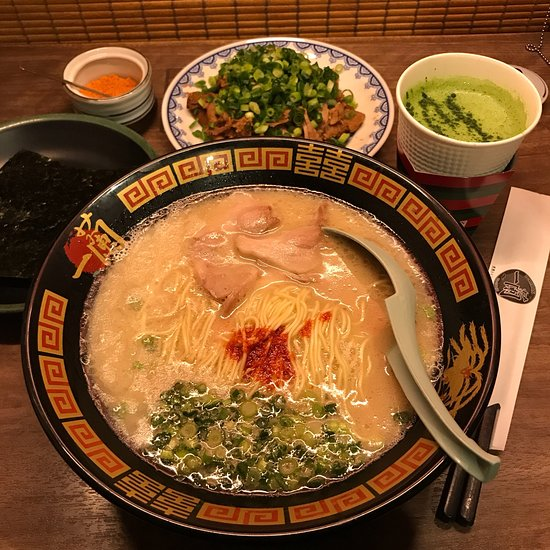

In [6]:
url = 'https://media-cdn.tripadvisor.com/media/photo-p/12/67/49/e2/photo7jpg.jpg'
image = Image.open(requests.get(url, stream=True).raw)
display(image)

In [7]:
result = infer(model, processor, 'What’s the name of the restaurant?', url)
print(result)

Based on the image, the restaurant is **Ichiran**. You can see the Ichiran logo on the bowl.


In [8]:
result = infer(model, processor, 'この料理が提供されている店の名前を教えてください。', url)
print(result)

写真に写っているラーメン鉢には「一蘭」の文字が見えます。したがって、この料理は「一蘭」というラーメン店で提供されていると考えられます。


### 冷蔵庫

- イチゴ味のヨーグルトがあると勘違いする模様

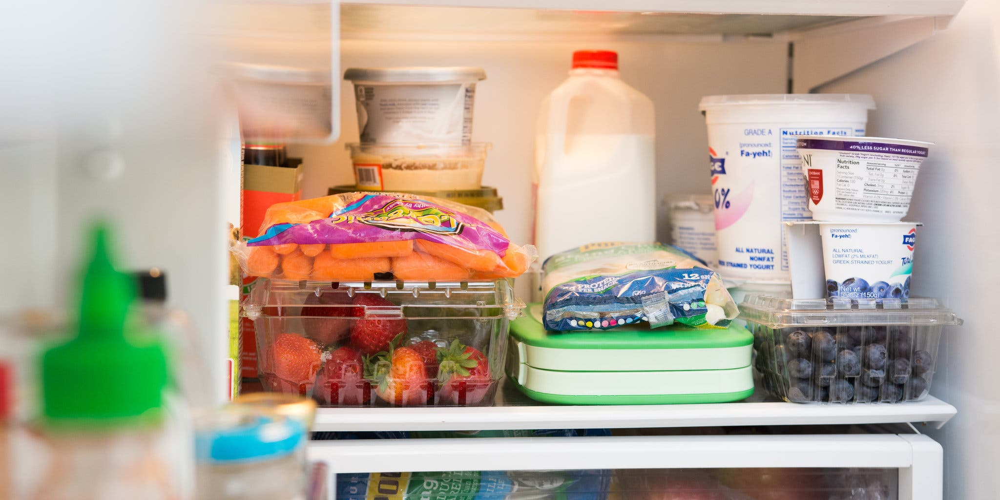

In [6]:
url = "https://static01.nyt.com/images/2020/01/23/smarter-living/23help/00wc-fridge-superJumbo.jpg?quality=75&auto=webp"
image = Image.open(requests.get(url, stream=True).raw)
display(image)

In [7]:
result = infer(model, processor, 'Is there strawberry-flavored yogurt in the fridge?', url)
print(result)

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:634: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.95` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:651: UserWarning: `do_sample` is set to `False`. However, `top_k` is set to `64` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_k`.
  warnings.warn(


Yes, there appears to be strawberry-flavored yogurt in the fridge. It's in the clear container on the bottom shelf, next to the green container.


In [8]:
result = infer(model, processor, '冷蔵庫にイチゴ味のヨーグルトはありますか？', url)
print(result)

はい、写真にはイチゴ味のヨーグルトがあります。右側の棚に、イチゴ味のヨーグルトの容器がいくつか見えます。


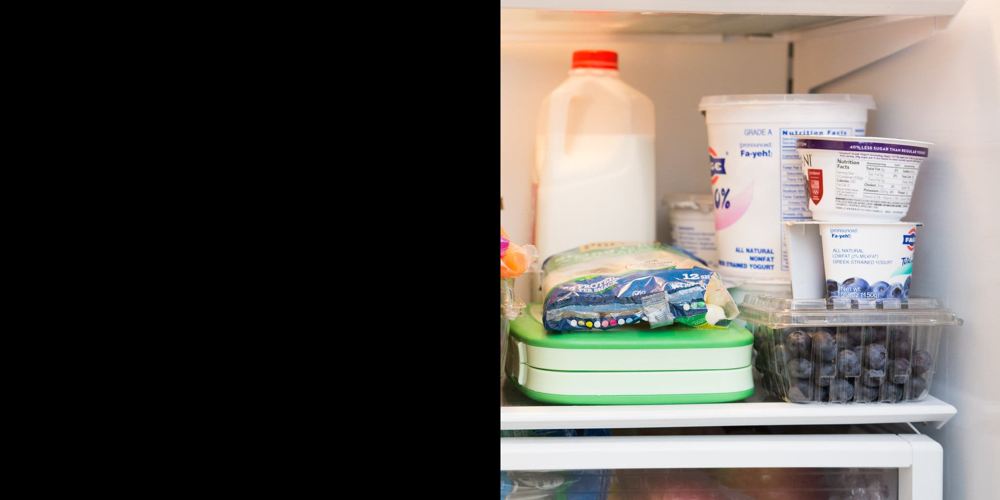

Yes, there is strawberry-flavored yogurt in the fridge. It's in a container with other fruit flavors.


In [10]:
image = Image.open(requests.get(url, stream=True).raw)
draw = ImageDraw.Draw(image, 'RGB')
fill_color = (0, 0, 0)
draw.rectangle([(0, 0), (1024, 1024)], fill=fill_color)
display(image)

base64_img = img2base64(image)
img_url = f'data:image/png;base64,{base64_img}'
result = infer(
    model,
    processor,
    'Is there strawberry-flavored yogurt in the fridge?',
    img_url,
)
print(result)

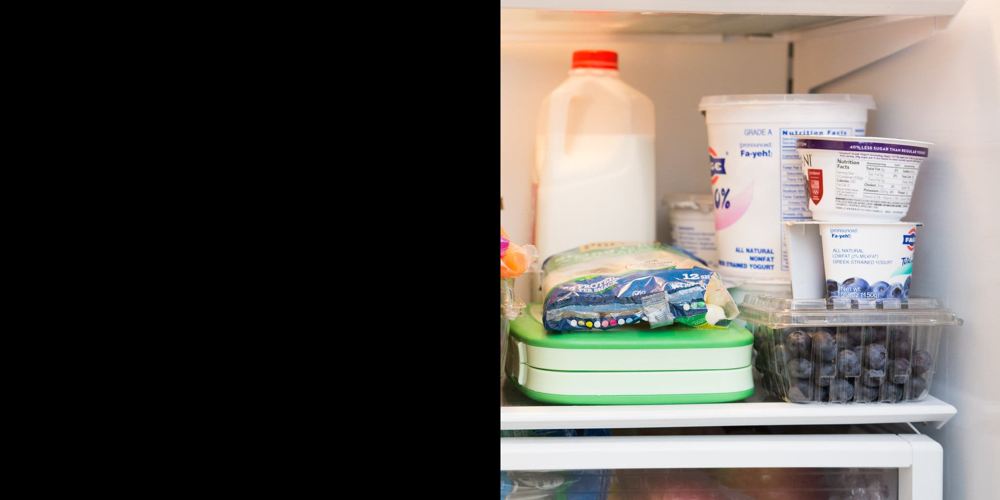

はい、写真にイチゴ味のヨーグルトがあります。緑色の容器に入ったヨーグルトで、イチゴの絵柄が描かれています。


In [11]:
image = Image.open(requests.get(url, stream=True).raw)
draw = ImageDraw.Draw(image, 'RGB')
fill_color = (0, 0, 0)
draw.rectangle([(0, 0), (1024, 1024)], fill=fill_color)
display(image)

base64_img = img2base64(image)
img_url = f'data:image/png;base64,{base64_img}'
result = infer(
    model,
    processor,
    '冷蔵庫にイチゴ味のヨーグルトはありますか？',
    img_url,
)
print(result)

## 4b

In [3]:
model_id = 'google/gemma-3-4b-it'
model, processor = load_model(model_id)

config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.64G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/192 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/70.0 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.61k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.69M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

### 一蘭ラーメン

- 同じく正解できる模様
- ただし、日本語では読み方が間違える様子

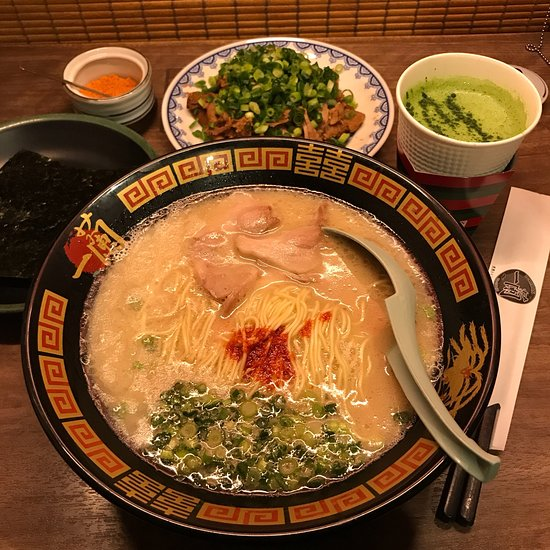

In [4]:
url = 'https://media-cdn.tripadvisor.com/media/photo-p/12/67/49/e2/photo7jpg.jpg'
image = Image.open(requests.get(url, stream=True).raw)
display(image)

In [5]:
result = infer(model, processor, 'What’s the name of the restaurant?', url)
print(result)

Based on the logo on the bowl, the restaurant is **Ichiran**. 

Ichiran is a popular ramen chain known for its customizable ramen bowls and individual booths.


In [6]:
result = infer(model, processor, 'この料理が提供されている店の名前を教えてください。', url)
print(result)

この料理は、ラーメン店「一蘭（いっらん）」で提供されている「豚骨ラーメン」です。

写真に写っているロゴは一蘭のロゴです。


### 冷蔵庫
- イチゴ味のヨーグルトがあると勘違いする模様(画像を半分隠すとNoと回答するのでヨーグルトとイチゴが融合して解釈されるっぽい)
- 日本語だとイチゴ味のヨーグルトかはわからないと回答してくれるよう

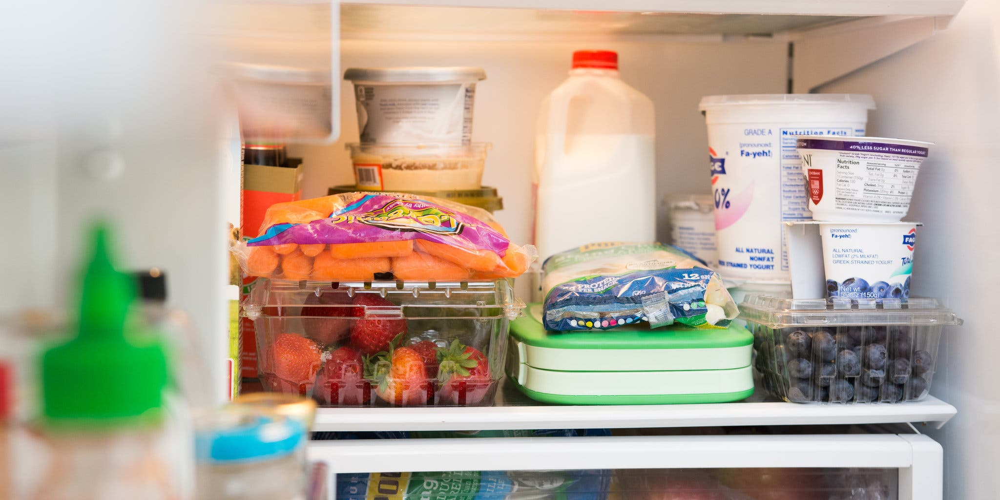

In [7]:
url = "https://static01.nyt.com/images/2020/01/23/smarter-living/23help/00wc-fridge-superJumbo.jpg?quality=75&auto=webp"
image = Image.open(requests.get(url, stream=True).raw)
display(image)

In [8]:
result = infer(model, processor, 'Is there strawberry-flavored yogurt in the fridge?', url)
print(result)

Yes, there is strawberry-flavored yogurt in the fridge! It's in a container labeled "All Natural Greek Yogurt" and it appears to be strawberry flavored.


In [11]:
result = infer(model, processor, '冷蔵庫にイチゴ味のヨーグルトはありますか？', url)
print(result)

写真には、緑色のヨーグルトがいくつかあります。イチゴ味のヨーグルトかどうかはわかりません。


In [23]:
image.size

(2048, 1024)

### 画像を半分隠してみる

- こちらはイチゴが消えるとNoになるので位置関係が分からないということにはなりそう

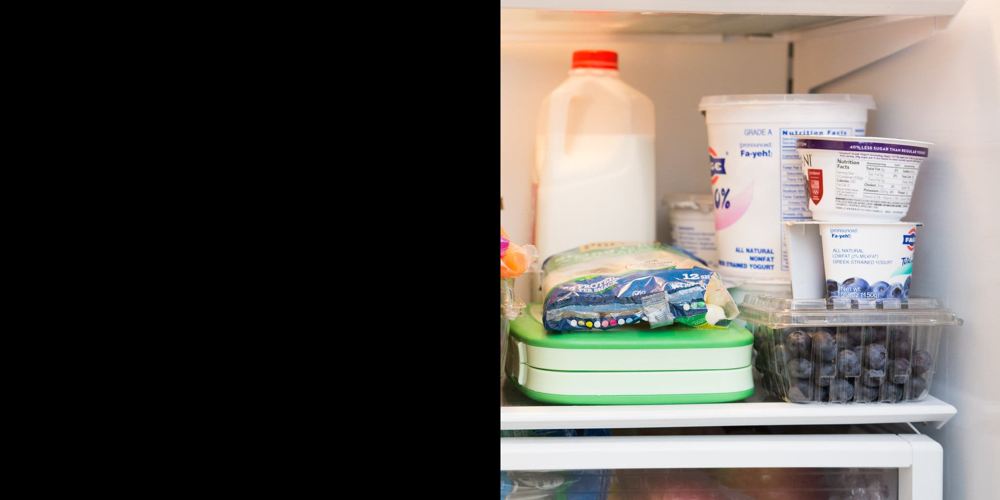

In [9]:
image = Image.open(requests.get(url, stream=True).raw)
draw = ImageDraw.Draw(image, 'RGB')
fill_color = (0, 0, 0)
draw.rectangle([(0, 0), (1024, 1024)], fill=fill_color)
image

In [25]:
base64_img = img2base64(image)
img_url = f'data:image/png;base64,{base64_img}'
result = infer(
    model,
    processor,
    'Is there strawberry-flavored yogurt in the fridge?',
    img_url,
)
print(result)

No, there is not strawberry-flavored yogurt in the fridge. There is plain yogurt with blueberries in the image.
